# Capstone Project Proposal -- Covid-19 Government Response Study

It's been more than half a year now since people were aware of the first case of Covid-19, the entire world has the same goal: cases of Covid-19 need to go to zero. People are fighting back with all the measures we can think of, and after six months now everybody is wondering, are we making progress against the pandemic? Is any country doing better than others, and what can we learn from the experience?  Here are some statistical data about the Covid-19 cases number, and also the goverment policies taken in different countries. The purpose of this project is to investigate whether the measures taken so far have helped to prevent the spreading of COVID-19, and how people can better protect themselves and families.

Two different sets of dataset were downloaded from this website: https://ourworldindata.org/coronavirus#:
1. Government's respsonse stringency in different countries, including restrictions on international travel, public transportation, workplace closures, school closures, and stay-at-home order. 

2. The total confirmed Covid-19 cases and daily confirmed cases by country, and also in population precentage.

With all the data together, I'm trying to explore the correlation between government response stringency and the population rate of confirmed cases. 

ps: previously I was tring to do some analysis about people's behavior responce to covid-19, including family status, working status, behavior(washing hands, wearing mask, going out, etc), however I need to extract data from a survey and answers to the survey is quite incomplete, it's too difficult to get a meaningful dataset from it. 

pps: I also found dataset about nationalwide monthly unemployment rate for each state for the past 10 years, together with the Covid-19 confirmed cases for each state, maybe helpful for some extra study.

<a id='top'></a>
# Table of Contents:  
1) [Load government response dataset](#governmentresponse)  
2) [Load case number dataset](#casenumber)  
3) [Clean and merge data together](#combine)  
4) [Run a quick trail model](#trialmodel)

5) [Evaluate the model](#model)

6) [Second model with country info](#secondmodel)

### Step 1: Load dataset, and merge them together

In [1]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import timeit
import datetime as dt
%matplotlib inline
sns.set_style('whitegrid')

import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import cufflinks as cf
init_notebook_mode(connected=True)
cf.go_offline()

<a id='governmentresponse'></a>
### Load dataset reguarding government response
[Back to Top](#top)

In [2]:
df_stayhome = pd.read_csv('incubator/stay-at-home-covid.csv', index_col='Code')
#df_stayhome.set_index('Code')
df_stayhome.columns=['country', 'date', 'stay at home']
df_stayhome['date'] = pd.to_datetime(df_stayhome['date'])
print(df_stayhome.shape)
df_stayhome.head()

(38357, 3)


,country,date,stay at home
Code,,,
AFG,Afghanistan,2020-01-01,0
AFG,Afghanistan,2020-01-02,0
AFG,Afghanistan,2020-01-03,0
AFG,Afghanistan,2020-01-04,0
AFG,Afghanistan,2020-01-05,0


In [3]:
df_schoolclose = pd.read_csv('incubator/school-closures-covid.csv', index_col='Code')
#df_stayhome.set_index('Code')
df_schoolclose.columns=['country', 'date', 'school closure']
df_schoolclose['date'] = pd.to_datetime(df_schoolclose['date'])
print(df_schoolclose.shape)
#df_schoolclose.head()

(38574, 3)


In [4]:
df_workplace = pd.read_csv('incubator/workplace-closures-covid.csv', index_col='Code')
#df_stayhome.set_index('Code')
df_workplace.columns=['country', 'date', 'workplace closure']
df_workplace['date'] = pd.to_datetime(df_workplace['date'])
print(df_workplace.shape)
#df_workplace.head()

(38422, 3)


In [5]:
df_public_transport = pd.read_csv('incubator/public-transport-covid.csv', index_col='Code')
#df_stayhome.set_index('Code')
df_public_transport.columns=['country', 'date', 'public transport closure']
df_public_transport['date'] = pd.to_datetime(df_public_transport['date'])
print(df_public_transport.shape)
#df_public_transport.head()

(38275, 3)


In [6]:
df_world_travel = pd.read_csv('incubator/international-travel-covid.csv', index_col='Code')
#df_stayhome.set_index('Code')
df_world_travel.columns=['country', 'date', 'international travel control']
df_world_travel['date'] = pd.to_datetime(df_world_travel['date'])
print(df_world_travel.shape)
#df_world_travel.head()

(38625, 3)


In [7]:
df_response = pd.merge(df_stayhome, df_schoolclose,how='inner',on=['Code','date','country'],left_index=True)
df_response = pd.merge(df_response, df_workplace,how='inner',on=['date','country'],left_index=True)
df_response = pd.merge(df_response, df_public_transport,how='inner',on=['date','country'],left_index=True)
df_response = pd.merge(df_response, df_world_travel,how='inner',on=['date','country'],left_index=True)
print(df_response.shape)
df_response.head()


(38218, 7)


,country,date,stay at home,school closure,workplace closure,public transport closure,international travel control
Code,,,,,,,
AFG,Afghanistan,2020-01-01,0,0,0,0,0
AFG,Afghanistan,2020-01-02,0,0,0,0,0
AFG,Afghanistan,2020-01-03,0,0,0,0,0
AFG,Afghanistan,2020-01-04,0,0,0,0,0
AFG,Afghanistan,2020-01-05,0,0,0,0,0


In [ ]:
df_response.to_csv('incubator/merged_government_response_0809.csv')

In [8]:
df_response.isnull().sum()

country                         0
date                            0
stay at home                    0
school closure                  0
workplace closure               0
public transport closure        0
international travel control    0
dtype: int64

In [9]:
df_response['month'] = df_response['date'].dt.month
df_response['week'] = df_response['date'].dt.week
df_response['date_str'] = df_response['date'].apply(lambda x: '{:%y-%m-%d}'.format(x))
df_response.tail(10)

,country,date,stay at home,school closure,workplace closure,public transport closure,international travel control,month,week,date_str
Code,,,,,,,,,,
ZWE,Zimbabwe,2020-07-20,1,3,1,1,4,7,30,20-07-20
ZWE,Zimbabwe,2020-07-21,1,3,1,1,4,7,30,20-07-21
ZWE,Zimbabwe,2020-07-22,2,3,1,1,4,7,30,20-07-22
ZWE,Zimbabwe,2020-07-23,2,3,1,1,4,7,30,20-07-23
ZWE,Zimbabwe,2020-07-24,2,3,1,1,4,7,30,20-07-24
ZWE,Zimbabwe,2020-07-25,2,3,1,1,4,7,30,20-07-25
ZWE,Zimbabwe,2020-07-26,2,3,1,1,4,7,30,20-07-26
ZWE,Zimbabwe,2020-07-27,2,3,1,1,4,7,31,20-07-27
ZWE,Zimbabwe,2020-07-28,2,3,1,1,4,7,31,20-07-28


(0, 100)

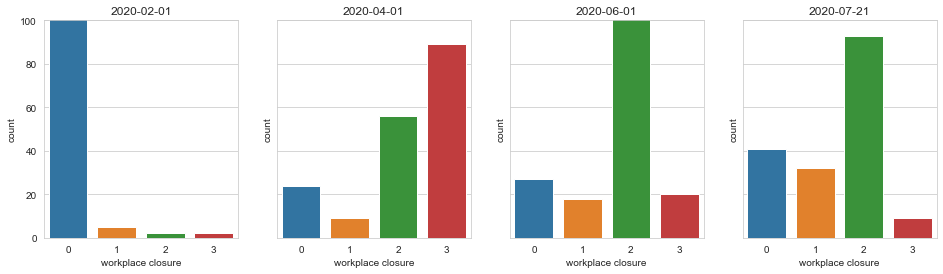

In [10]:
fig, axes = plt.subplots(1,4,figsize=(16,4), sharey=True)
response='workplace closure'
sns.countplot(x=response, data=df_response[df_response['date']=='2020-03-01'], ax=axes[0])
sns.countplot(x=response, data=df_response[df_response['date']=='2020-04-01'], ax=axes[1])
sns.countplot(x=response, data=df_response[df_response['date']=='2020-06-01'], ax=axes[2])
sns.countplot(x=response, data=df_response[df_response['date']=='2020-07-21'], ax=axes[3])
axes[0].set_title('2020-02-01')
axes[1].set_title('2020-04-01')
axes[2].set_title('2020-06-01')
axes[3].set_title('2020-07-21')
plt.ylim(0,100)

In [11]:
import plotly.express as px

fig = px.choropleth(df_response,                            # Input Dataframe
                     locations="country",                   # identify country code column
                     locationmode = 'country names',
                     color="stay at home",                     # identify representing column
                     hover_name="country",              # identify hover name
                     animation_frame="week",        # identify date column
                     projection="natural earth",        # select projection
                     color_continuous_scale = 'Peach',  # select prefer color scale
                     range_color=[0,3]              # select range of dataset
                     )        
fig.show()          
# fig.write_html("example_map.html")       

In [12]:
df_response[df_response['country']=='Canada'].groupby('month').min()

,country,date,stay at home,school closure,workplace closure,public transport closure,international travel control,week,date_str
month,,,,,,,,,
1,Canada,2020-01-01,0,0,0,0,0,1,20-01-01
2,Canada,2020-02-01,0,0,0,0,1,5,20-02-01
3,Canada,2020-03-01,0,0,0,0,1,9,20-03-01
4,Canada,2020-04-01,1,3,3,0,4,14,20-04-01
5,Canada,2020-05-01,1,3,3,0,4,18,20-05-01
6,Canada,2020-06-01,1,3,2,0,4,23,20-06-01
7,Canada,2020-07-01,1,3,2,0,4,27,20-07-01


In [13]:
df_response[df_response['country']=='Canada'].groupby('month').max()

,country,date,stay at home,school closure,workplace closure,public transport closure,international travel control,week,date_str
month,,,,,,,,,
1,Canada,2020-01-31,0,0,0,0,1,5,20-01-31
2,Canada,2020-02-29,0,0,0,0,1,9,20-02-29
3,Canada,2020-03-31,1,3,3,0,4,14,20-03-31
4,Canada,2020-04-30,1,3,3,0,4,18,20-04-30
5,Canada,2020-05-31,1,3,3,0,4,22,20-05-31
6,Canada,2020-06-30,1,3,3,0,4,27,20-06-30
7,Canada,2020-07-19,1,3,2,0,4,29,20-07-19


In [21]:
df_response.groupby('country')['date'].max().min()

Timestamp('2020-06-21 00:00:00')

<a id='casenumber'></a>
### Load dataset reguarding confirmed cases number over world
[Back to top](#top)

In [ ]:
#most frequently visited country files:
#[United States, United Kingdom, Germany, India, Spain, France, Brazil, Canada, Australia, New Zealand, Sweden, Mexico]

In [14]:
df_cases = pd.read_csv('incubator/daily_and_total_confirmed_covid_cases_per_million.csv', index_col='iso_code')

In [ ]:
df_cases.iloc[2001:10001:1000,1:40:2]

Check the country column, discard the samples with label "world", save the data to a seperate csv file. Then discard the sample with label "international". 

In [15]:
df_cases.rename(columns={'location':'country'}, inplace = True)
df_world = df_cases[df_cases['country']=='World']
df_world.tail()

,continent,country,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
iso_code,,,,,,,,,,,,,,,,,,,,,
OWID_WRL,NaN,World,2020-08-05,18523997.0,253667.0,700545.0,6811.0,2376.456,32.543,89.873,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
OWID_WRL,NaN,World,2020-08-06,18799014.0,275017.0,707717.0,7172.0,2411.738,35.282,90.793,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
OWID_WRL,NaN,World,2020-08-07,19083487.0,284473.0,714628.0,6911.0,2448.233,36.495,91.680,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
OWID_WRL,NaN,World,2020-08-08,19357702.0,274215.0,721177.0,6549.0,2483.413,35.179,92.520,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58
OWID_WRL,NaN,World,2020-08-09,19624044.0,266342.0,726953.0,5776.0,2517.582,34.169,93.261,...,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58


In [4]:
df_world.to_csv('incubator/world_confirmed_cases_till_0809.csv',sep=',')

In [16]:
df_cases = df_cases.drop(index='OWID_WRL', axis=0)
df_cases = df_cases[df_cases['country']!='International']
df_cases.shape

(35430, 35)

In [17]:
df_cases['date'] = pd.to_datetime(df_cases['date'])
df_cases['date_str'] = df_cases['date'].apply(lambda x: '{:%y-%m-%d}'.format(x))
df_cases.head()

,continent,country,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,date_str
iso_code,,,,,,,,,,,,,,,,,,,,,
AFG,Asia,Afghanistan,2019-12-31,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,19-12-31
AFG,Asia,Afghanistan,2020-01-01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,20-01-01
AFG,Asia,Afghanistan,2020-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,20-01-02
AFG,Asia,Afghanistan,2020-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,20-01-03
AFG,Asia,Afghanistan,2020-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,20-01-04


<a id='combine'></a>
### Step 2: Check the null values in the dataframe, try to fill in with meaningful values, and combine data together
[Back to top](#top)

In [18]:
df_cases.isnull().sum()

continent                              0
country                                0
date                                   0
total_cases                          345
new_cases                            345
total_deaths                         345
new_deaths                           345
total_cases_per_million              345
new_cases_per_million                345
total_deaths_per_million             345
new_deaths_per_million               345
new_tests                          24341
total_tests                        23994
total_tests_per_thousand           23994
new_tests_per_thousand             24341
new_tests_smoothed                 22962
new_tests_smoothed_per_thousand    22962
tests_per_case                     23804
positive_rate                      23460
tests_units                        22216
stringency_index                    6454
population                             0
population_density                  1564
median_age                          3543
aged_65_older   

#### Check the NaN value for columns of case numbers, death numbers, etc

There are some columns with same number(345) of null value, check what's going on with them first.

In [19]:
null_cols = ['total_cases', 'new_cases', 'total_deaths', 'new_deaths', 'total_cases_per_million', 'new_cases_per_million', 
             'total_deaths_per_million', 'new_deaths_per_million']
null_country = df_cases[df_cases['total_cases'].isnull()].groupby('country')['date'].min().index.values
null_country

array(['Argentina', 'Bangladesh', 'Belarus', 'Bolivia', 'Colombia',
       'Croatia', 'Estonia', 'Fiji', 'Finland', 'Greece', 'Hong Kong',
       'Hungary', 'Israel', 'Kazakhstan', 'Kenya', 'Latvia', 'Lithuania',
       'Luxembourg', 'Malaysia', 'Malta', 'Mexico', 'Morocco', 'Nepal',
       'New Zealand', 'Panama', 'Paraguay', 'Peru', 'Portugal', 'Senegal',
       'Serbia', 'South Africa', 'Thailand', 'Togo',
       'United Arab Emirates', 'Vietnam'], dtype=object)

In [20]:
for country in null_country:
#    print(country)
    temp = df_cases.loc[df_cases['country']==country, null_cols]
    temp.fillna(method='ffill', inplace = True)
    df_cases.loc[df_cases['country']== country,null_cols] = temp
    

In [21]:
for country in null_country:
#    print(country)
    temp = df_cases.loc[df_cases['country']==country, null_cols]
    temp.fillna(value=0, inplace = True)
    df_cases.loc[df_cases['country']== country,null_cols] = temp
    

#### Similarly, fill NaN value for stringency_index

In [22]:
stringency_null = df_cases[df_cases['stringency_index'].isnull()]['country'].unique()
#stringency_null

In [23]:
for country in stringency_null:
#    print(country)
    temp = df_cases.loc[df_cases['country']==country, 'stringency_index']
    temp.fillna(method='ffill', inplace = True)
    df_cases.loc[df_cases['country']== country,'stringency_index'] = temp

In [24]:
df_cases['stringency_index'].fillna(value=0,inplace=True)

In [25]:
df_cases.isnull().sum()

continent                              0
country                                0
date                                   0
total_cases                            0
new_cases                              0
total_deaths                           0
new_deaths                             0
total_cases_per_million                0
new_cases_per_million                  0
total_deaths_per_million               0
new_deaths_per_million                 0
new_tests                          24341
total_tests                        23994
total_tests_per_thousand           23994
new_tests_per_thousand             24341
new_tests_smoothed                 22962
new_tests_smoothed_per_thousand    22962
tests_per_case                     23804
positive_rate                      23460
tests_units                        22216
stringency_index                       0
population                             0
population_density                  1564
median_age                          3543
aged_65_older   

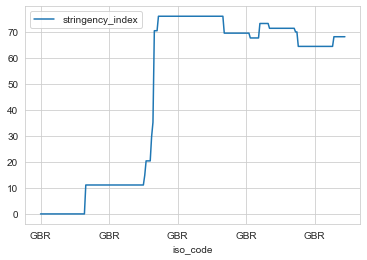

In [26]:
df_cases.loc[df_cases['country']=='United Kingdom',['date_str','stringency_index']].plot()

(0, 7000)

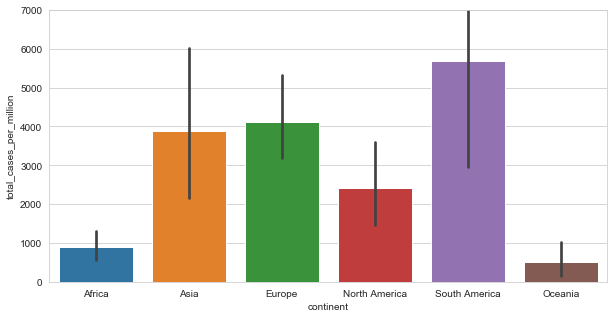

In [27]:
plt.figure(figsize=(10,5))
order = ['Africa','Asia', 'Europe','North America', 'South America', 'Oceania']
#sns.countplot(x='continent',data=df_cases)
sns.barplot(x='continent',y='total_cases_per_million',data=df_cases[df_cases['date']=='2020-08-01'], order = order)
plt.ylim(0,7000)

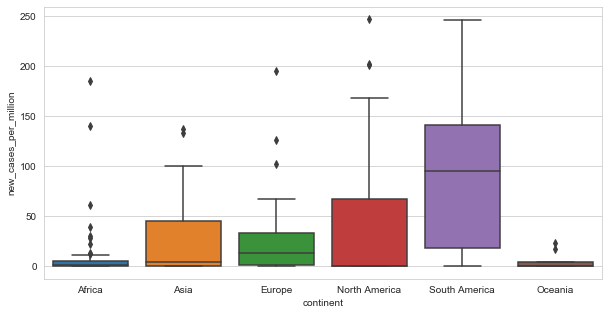

In [28]:
plt.figure(figsize=(10,5))
sns.boxplot(x='continent',y='new_cases_per_million' , data=df_cases[df_cases['date']=='2020-08-01'], order = order)

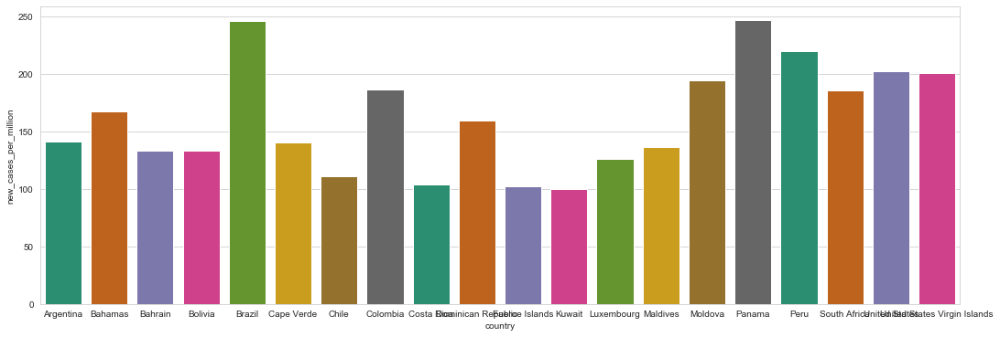

In [29]:
plt.figure(figsize=(18,6))
sns.barplot(x='country',y='new_cases_per_million', palette ='Dark2',
            data=df_cases[(df_cases['date']=='2020-08-01') & (df_cases['new_cases_per_million']>100)])

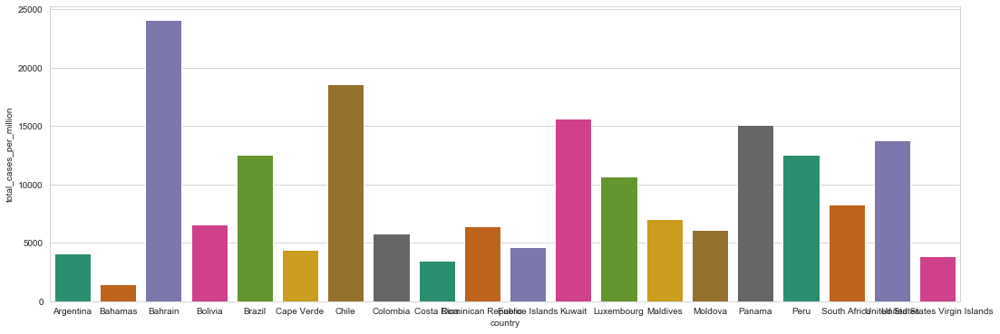

In [30]:
plt.figure(figsize=(18,6))
sns.barplot(x='country',y='total_cases_per_million', palette ='Dark2',
            data=df_cases[(df_cases['date']=='2020-08-01') & (df_cases['new_cases_per_million']>100)])

In [31]:
df_merge = pd.merge(df_response, df_cases, how='inner', on=['date','country','date_str'], left_index=True)
print(df_merge.shape)
df_merge['week'] = df_merge['date'].dt.week
df_merge.head()

(28915, 43)


,country,date,stay at home,school closure,workplace closure,public transport closure,international travel control,month,week,date_str,...,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy
iso_code,,,,,,,,,,,,,,,,,,,,,
AFG,Afghanistan,2020-01-01,0,0,0,0,0,1,1,20-01-01,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
AFG,Afghanistan,2020-01-02,0,0,0,0,0,1,1,20-01-02,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
AFG,Afghanistan,2020-01-03,0,0,0,0,0,1,1,20-01-03,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
AFG,Afghanistan,2020-01-04,0,0,0,0,0,1,1,20-01-04,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83
AFG,Afghanistan,2020-01-05,0,0,0,0,0,1,1,20-01-05,...,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83


Text(0.5, 0, 'total cases per million')

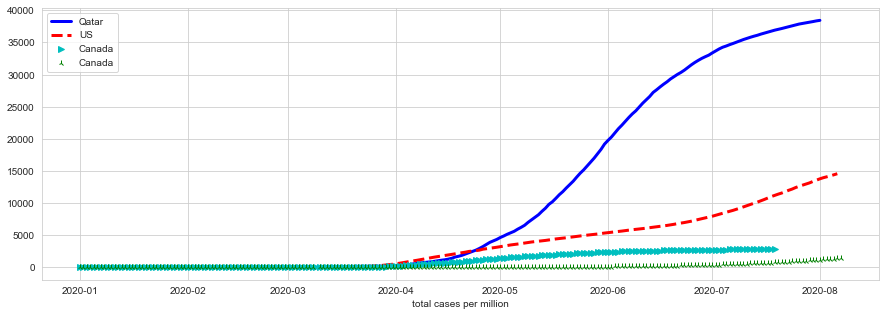

In [34]:
plt.figure(figsize=(15,5))
#country_list = ['Qatar', 'Canada', 'Japan', 'United States']
#for country in country_list:
plt.plot(df_merge[df_merge['country']=='Qatar']['date'],
         df_merge[df_merge['country']=='Qatar']['total_cases_per_million'],'b-', lw=3, label ='Qatar')
plt.plot(df_merge[df_merge['country']=='United States']['date'],
         df_merge[df_merge['country']=='United States']['total_cases_per_million'],'r--', lw=3, label = 'US')
plt.plot(df_merge[df_merge['country']=='Canada']['date'],
         df_merge[df_merge['country']=='Canada']['total_cases_per_million'],'c>', label = 'Canada')
plt.plot(df_merge[df_merge['country']=='India']['date'],
         df_merge[df_merge['country']=='India']['total_cases_per_million'],'g2', label = 'Canada')
plt.legend()
plt.xlabel('total cases per million')

In [33]:
# Select a portion of data
df_select = df_merge[df_merge['date']=='2020-07-15']
data = dict(type = 'choropleth',
            locations = df_select['country'],
            locationmode = 'country names',
            z = df_select['total_cases_per_million'],
 #           text = df_select['total_cases_per_million'],
#            marker = dict(),
            colorscale = 'Viridis',
            colorbar = {'title': 'Total cases per millioni'},
            zmin = 0,
            zmax = 15000
            )
layout = dict(title = 'Total confirmed cases per million over the world at July 15th, 2020',
              geo = dict(showframe = False,
                        projection = {'type':'natural earth'}))
choromap = go.Figure(data = [data],layout = layout)
iplot(choromap,validate=False)

#### Check the NaN value for population density

There are some countryies with NaN for population density, actuall for these countries, the population density is null for every sample, while population is recorded in data, and all are of very small value. So if later on want to use the population density value in model, these countries will be discarded. RIght now just leave them there.

In [58]:
popu_den_null = df_cases[df_cases['population_density'].isnull()]['country'].unique()
popu_den_null

array(['Anguilla', 'Bonaire Sint Eustatius and Saba', 'Falkland Islands',
       'Guernsey', 'Jersey', 'Montserrat', 'South Sudan', 'Syria',
       'Taiwan', 'Vatican', 'Western Sahara'], dtype=object)

In [59]:
[{country:df_cases[df_cases['country']==country]['population'].unique()} for country in popu_den_null]
#     print(df_cases[df_cases['country']==country]['population_density'].notnull().sum())
#     print(df_cases[df_cases['country']==country]['population'].unique())

[{'Anguilla': array([15002.])},
 {'Bonaire Sint Eustatius and Saba': array([26221.])},
 {'Falkland Islands': array([3483.])},
 {'Guernsey': array([67052.])},
 {'Jersey': array([101073.])},
 {'Montserrat': array([4999.])},
 {'South Sudan': array([11193729.])},
 {'Syria': array([17500657.])},
 {'Taiwan': array([23816775.])},
 {'Vatican': array([809.])},
 {'Western Sahara': array([597330.])}]

In [45]:
import plotly.express as px

fig = px.choropleth(df_merge,                            # Input Dataframe
                     locations="country",                   # identify country code column
                     locationmode = 'country names',
                     color=np.log10(df_merge["total_cases"]),                     # identify representing column
                     hover_name="country",              # identify hover name
                     animation_frame="week",        # identify date column
                     projection="natural earth",        # select projection
                     color_continuous_scale = 'Peach',  # select prefer color scale
                     range_color=[0,7]              # select range of dataset
                     )        
fig.show()          

In [46]:
import plotly.express as px

fig = px.choropleth(df_merge,                            # Input Dataframe
                     locations="country",                   # identify country code column
                     locationmode = 'country names',
                     color="total_cases_per_million",                     # identify representing column
                     hover_name="country",              # identify hover name
                     animation_frame="week",        # identify date column
                     projection="natural earth",        # select projection
                     color_continuous_scale = 'Peach',  # select prefer color scale
                     range_color=[0,250]              # select range of dataset
                     )        
fig.show()          

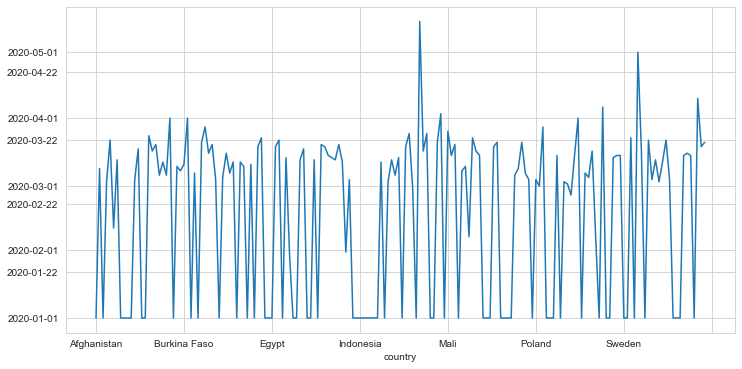

In [62]:
starting_date = df_merge.groupby('country')['date'].min()
starting_date.plot(figsize=(12,6))

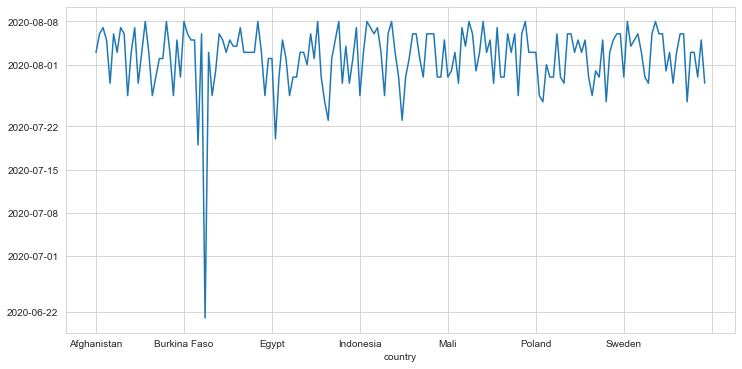

In [63]:
end_date = df_merge.groupby('country')['date'].max()
end_date.plot(figsize=(12,6))

<a id='trialmodel'></a>
### Step 3: Select some data, run a trail model quickly
[Back to top](#top)

In [47]:
df_merge.columns

Index(['country', 'date', 'stay at home', 'school closure',
       'workplace closure', 'public transport closure',
       'international travel control', 'month', 'week', 'date_str',
       'continent', 'total_cases', 'new_cases', 'total_deaths', 'new_deaths',
       'total_cases_per_million', 'new_cases_per_million',
       'total_deaths_per_million', 'new_deaths_per_million', 'new_tests',
       'total_tests', 'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'tests_per_case', 'positive_rate', 'tests_units', 'stringency_index',
       'population', 'population_density', 'median_age', 'aged_65_older',
       'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy'],
      dtype='object')

In [171]:
# country_list1 = starting_date[starting_date<'2020-03-01'].index.values
# country_list2 = end_date[end_date>='2020-07-19'].index.values
# keeplist = list(set(country_list1) & set(country_list2))
# len(keeplist)
keep_cols=['continent','country', 'date', 'stay at home', 'school closure', 'workplace closure', 'public transport closure', 
           'international travel control','total_cases_per_million', 'new_cases_per_million', 'total_deaths_per_million',
           'new_deaths_per_million','population_density', 'median_age','hospital_beds_per_thousand','date_str']

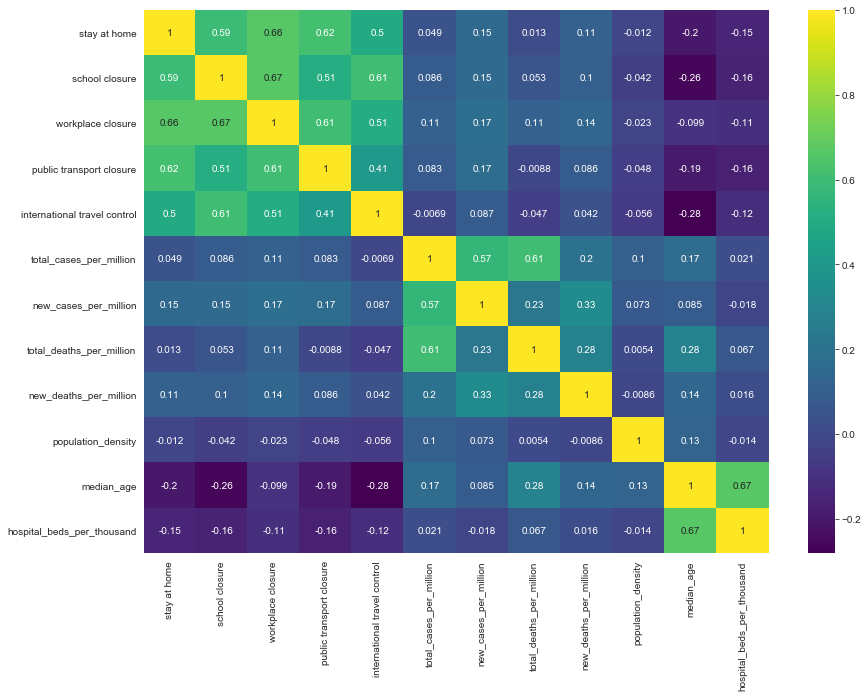

In [172]:
plt.figure(figsize=(14,10))
sns.heatmap(df_merge[keep_cols].corr(), annot=True, cmap='viridis')

In [173]:
df_keep = df_merge[keep_cols]
starting_date = df_keep.groupby('country')['date'].min()
(starting_date['Chile']-starting_date['Brazil']).days
starting_date

country
Afghanistan   2020-01-01
Albania       2020-03-09
Algeria       2020-01-01
Andorra       2020-03-03
Angola        2020-03-22
                 ...    
Venezuela     2020-03-15
Vietnam       2020-01-01
Yemen         2020-04-10
Zambia        2020-03-19
Zimbabwe      2020-03-21
Name: date, Length: 174, dtype: datetime64[ns]

In [174]:
df_keep['starting_date'] = df_keep['country'].map(lambda x: starting_date[x])
df_keep['day'] = (df_keep['date'] - df_keep['starting_date']).apply(lambda x: x.days)
df_keep.tail()


,continent,country,date,stay at home,school closure,workplace closure,public transport closure,international travel control,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,population_density,median_age,hospital_beds_per_thousand,date_str,starting_date,day
iso_code,,,,,,,,,,,,,,,,,,
ZWE,Africa,Zimbabwe,2020-07-25,2,3,1,1,4,154.478,11.572,2.153,0.269,42.729,19.6,1.7,20-07-25,2020-03-21,126
ZWE,Africa,Zimbabwe,2020-07-26,2,3,1,1,4,163.763,9.285,2.288,0.135,42.729,19.6,1.7,20-07-26,2020-03-21,127
ZWE,Africa,Zimbabwe,2020-07-27,2,3,1,1,4,169.011,5.248,2.288,0.000,42.729,19.6,1.7,20-07-27,2020-03-21,128
ZWE,Africa,Zimbabwe,2020-07-28,2,3,1,1,4,181.929,12.918,2.422,0.135,42.729,19.6,1.7,20-07-28,2020-03-21,129
ZWE,Africa,Zimbabwe,2020-07-29,2,3,1,1,4,189.532,7.603,2.691,0.269,42.729,19.6,1.7,20-07-29,2020-03-21,130


In [175]:
df_keep.isnull().sum()

continent                          0
country                            0
date                               0
stay at home                       0
school closure                     0
workplace closure                  0
public transport closure           0
international travel control       0
total_cases_per_million            0
new_cases_per_million              0
total_deaths_per_million           0
new_deaths_per_million             0
population_density               475
median_age                       981
hospital_beds_per_thousand      3343
date_str                           0
starting_date                      0
day                                0
dtype: int64

In [176]:
popu_null = df_keep[df_keep['population_density'].isnull()]['country'].unique()

In [177]:
df_keep = df_keep.loc[df_keep['country'].apply(lambda x: x not in popu_null)]
df_keep.shape

(28440, 18)

In [178]:
median_age_null = df_keep[df_keep['median_age'].isnull()]['country'].unique()
median_age_null

array(['Andorra', 'Bermuda', 'Cayman Islands', 'Dominica', 'Greenland',
       'Kosovo', 'San Marino'], dtype=object)

In [179]:
df_keep[df_keep['country']=='Greenland']['median_age'].notnull().sum()

0

In [180]:
df_keep = df_keep.loc[df_keep['country'].apply(lambda x: x not in median_age_null)]
df_keep.shape

(27459, 18)

In [59]:
hospital_null = df_keep[df_keep['hospital_beds_per_thousand'].isnull()]['country'].unique()
hospital_null

array(['Angola', 'Aruba', 'Chad', 'Congo', "Cote d'Ivoire",
       'Democratic Republic of Congo', 'Guam', 'Hong Kong', 'Lesotho',
       'Mauritania', 'Namibia', 'Nigeria', 'Palestine',
       'Papua New Guinea', 'Puerto Rico', 'Rwanda', 'Senegal',
       'Sierra Leone'], dtype=object)

In [60]:
#df_keep[df_keep['country']=='Angola']['hospital_beds_per_thousand'].notnull().sum()
# keep_cols=['country', 'date', 'stay at home', 'school closure', 'workplace closure', 'public transport closure', 
#            'international travel control','total_cases_per_million', 'new_cases_per_million', 'total_deaths_per_million',
#            'new_deaths_per_million','population_density', 'median_age','hospital_beds_per_thousand','date_str']
len(df_keep['country'].unique())

164

<a id='model'></a>
### Begin to build model
[Back to top](#top)

In [162]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping

In [181]:
X1_cols =['stay at home', 'school closure', 'workplace closure', 'public transport closure', 'international travel control',
         'total_cases_per_million', 'total_deaths_per_million', 'population_density', 'median_age','day']
y_col = ['new_cases_per_million']

In [255]:
X = df_keep[X1_cols].values
y = df_keep[y_col].values
X.shape

(27459, 10)

In [257]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 101)

In [258]:
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [215]:
model = Sequential()

model.add(Dense(10, activation='relu'))

model.add(Dense(5, activation='relu'))
#model.add(Dropout(0.2))
model.add(Dense(1, activation='relu'))

model.compile(loss='mse', optimizer='adam')
earlystop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

In [216]:
model.fit(x=X_train, y=y_train, epochs=5000, batch_size=256, 
          validation_data=(X_test, y_test),
          callbacks = [earlystop])

Train on 21967 samples, validate on 5492 samples
Epoch 1/5000
21967/21967 [==============================] - 1s 40us/sample - loss: 2376.2022 - val_loss: 3231.8149
Epoch 2/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 2283.0910 - val_loss: 3084.1576
Epoch 3/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 2131.6401 - val_loss: 2901.0714
Epoch 4/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 2004.1946 - val_loss: 2799.3693
Epoch 5/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 1949.6357 - val_loss: 2748.2973
Epoch 6/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 1907.3938 - val_loss: 2697.1957
Epoch 7/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 1865.2338 - val_loss: 2648.7030
Epoch 8/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 1825.8992 - val_loss: 2600.6757
Epoch 9/5000
21967/21967 [============

21967/21967 [==============================] - 0s 7us/sample - loss: 896.8411 - val_loss: 1350.9357
Epoch 73/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 896.1016 - val_loss: 1347.0379
Epoch 74/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 893.0602 - val_loss: 1349.0877
Epoch 75/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 891.8339 - val_loss: 1347.0101
Epoch 76/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 889.7335 - val_loss: 1341.7384
Epoch 77/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 887.9289 - val_loss: 1341.0304
Epoch 78/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 886.3620 - val_loss: 1341.4593
Epoch 79/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 884.8979 - val_loss: 1341.2140
Epoch 80/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 883.1206 - val_loss

21967/21967 [==============================] - 0s 7us/sample - loss: 819.5300 - val_loss: 1273.8289
Epoch 144/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 819.7559 - val_loss: 1273.6410
Epoch 145/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 819.0244 - val_loss: 1273.9848
Epoch 146/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 818.9481 - val_loss: 1274.4199
Epoch 147/5000
21967/21967 [==============================] - 0s 8us/sample - loss: 817.9092 - val_loss: 1272.0646
Epoch 148/5000
21967/21967 [==============================] - 0s 8us/sample - loss: 816.8224 - val_loss: 1272.0249
Epoch 149/5000
21967/21967 [==============================] - 0s 8us/sample - loss: 817.0474 - val_loss: 1271.0592
Epoch 150/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 815.3171 - val_loss: 1271.1405
Epoch 151/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 814.4657 - 

21967/21967 [==============================] - 0s 7us/sample - loss: 774.4180 - val_loss: 1231.1197
Epoch 215/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 773.9002 - val_loss: 1226.8119
Epoch 216/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 772.7576 - val_loss: 1228.4612
Epoch 217/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 771.5319 - val_loss: 1226.5853
Epoch 218/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 771.8850 - val_loss: 1229.7604
Epoch 219/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 771.3565 - val_loss: 1223.4278
Epoch 220/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 770.3910 - val_loss: 1222.6345
Epoch 221/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 769.3039 - val_loss: 1224.9893
Epoch 222/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 769.1920 - 

21967/21967 [==============================] - 0s 7us/sample - loss: 706.2769 - val_loss: 1149.5532
Epoch 286/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 704.9303 - val_loss: 1147.0184
Epoch 287/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 704.6315 - val_loss: 1142.9065
Epoch 288/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 703.6293 - val_loss: 1143.2754
Epoch 289/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 702.8419 - val_loss: 1142.0919
Epoch 290/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 701.6716 - val_loss: 1141.7822
Epoch 291/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 701.3202 - val_loss: 1138.4905
Epoch 292/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 700.4832 - val_loss: 1142.6125
Epoch 293/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 699.0285 - 

21967/21967 [==============================] - 0s 7us/sample - loss: 653.2481 - val_loss: 1078.0750
Epoch 357/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 653.7433 - val_loss: 1079.1758
Epoch 358/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 652.4169 - val_loss: 1076.3593
Epoch 359/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 651.7296 - val_loss: 1078.0875
Epoch 360/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 651.2125 - val_loss: 1083.8869
Epoch 361/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 651.6232 - val_loss: 1076.4894
Epoch 362/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 650.5367 - val_loss: 1078.5494
Epoch 363/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 650.1610 - val_loss: 1071.1121
Epoch 364/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 650.7820 - 

21967/21967 [==============================] - 0s 7us/sample - loss: 619.6369 - val_loss: 1037.7647
Epoch 428/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 619.0267 - val_loss: 1034.7061
Epoch 429/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 619.0492 - val_loss: 1040.0379
Epoch 430/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 620.2499 - val_loss: 1039.1861
Epoch 431/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 618.1890 - val_loss: 1037.4194
Epoch 432/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 618.3251 - val_loss: 1035.1378
Epoch 433/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 618.0238 - val_loss: 1036.4504
Epoch 434/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 616.9122 - val_loss: 1035.0720
Epoch 435/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 617.2967 - 

21967/21967 [==============================] - 0s 7us/sample - loss: 594.4716 - val_loss: 1021.5386
Epoch 499/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 594.1080 - val_loss: 1024.6067
Epoch 500/5000
21967/21967 [==============================] - 0s 14us/sample - loss: 592.2434 - val_loss: 1018.9793
Epoch 501/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 593.9612 - val_loss: 1019.4793
Epoch 502/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 594.3368 - val_loss: 1019.0828
Epoch 503/5000
21967/21967 [==============================] - 0s 8us/sample - loss: 592.5938 - val_loss: 1025.2094
Epoch 504/5000
21967/21967 [==============================] - 0s 8us/sample - loss: 592.5599 - val_loss: 1023.4610
Epoch 505/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 592.1526 - val_loss: 1021.5552
Epoch 506/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 591.6996 -

21967/21967 [==============================] - 0s 7us/sample - loss: 574.7353 - val_loss: 1009.7137
Epoch 570/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 575.4660 - val_loss: 1010.3327
Epoch 571/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 573.4842 - val_loss: 1007.9735
Epoch 572/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 573.5154 - val_loss: 1007.4195
Epoch 573/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 572.9280 - val_loss: 1010.6719
Epoch 574/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 573.1767 - val_loss: 1009.0083
Epoch 575/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 572.4247 - val_loss: 1006.9517
Epoch 576/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 572.4073 - val_loss: 1007.6343
Epoch 577/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 572.9845 - 

21967/21967 [==============================] - 0s 7us/sample - loss: 562.9700 - val_loss: 1003.9313
Epoch 641/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 562.5424 - val_loss: 1004.2814
Epoch 642/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 564.3688 - val_loss: 1004.1803
Epoch 643/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 562.3766 - val_loss: 1003.8196
Epoch 644/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 564.1436 - val_loss: 1005.2815
Epoch 645/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 565.1889 - val_loss: 1004.5344
Epoch 646/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 563.2089 - val_loss: 1004.5894
Epoch 647/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 562.7100 - val_loss: 1002.7743
Epoch 648/5000
21967/21967 [==============================] - 0s 7us/sample - loss: 561.6677 - 

In [217]:
model_loss = pd.DataFrame(model.history.history)

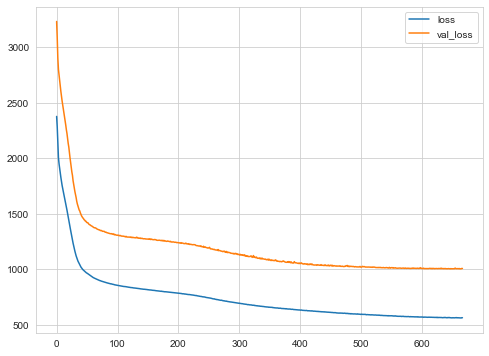

In [218]:
model_loss.plot(figsize=(8,6))

In [259]:
y_train_pred = model.predict(X_train)
list1 = np.stack((y_train[::,0], y_train_pred[::,0]))
list1[:10].transpose()

array([[ 0.        ,  5.60619926],
       [14.295     ,  8.18486404],
       [ 5.315     ,  1.58120799],
       ...,
       [10.038     , 20.1954155 ],
       [ 0.207     , 12.33244514],
       [ 0.024     ,  1.58120799]])

#### Comments:

Though the trainning error and validation error are both decreasing, both the erros are still relatively large. Also there is always a center distance between the training loss and validation loss after certain amount of iterations, which implies the model tried here is not a good generalization from trainning data to validationi data(a model with both high variance and high bias....) 

What can be done to improve the model:
1. Do a more careful EDA, try to use as many features as possible, i.e. the information from country is not used in the model, could be encoded and useful.

2. may think about other methods to use for this problem. Each day's new case number can be considered as a time series for each country, a time seris model is worth to try.

<a id='secondmodel'></a>
### Second model with country information
[Back to top](#top)

In [183]:
X2_cols =['continent','stay at home', 'school closure', 'workplace closure', 'public transport closure', 'international travel control',
         'total_cases_per_million', 'total_deaths_per_million', 'population_density', 'median_age','day']
y_col = ['new_cases_per_million']

In [197]:
X2 = df_keep[X2_cols]
X2 = pd.get_dummies(X2, columns=['continent'], drop_first=False)
print(X2.shape)
X2=X2.values
y = df_keep[y_col].values

(27459, 16)


In [206]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y, test_size = 0.2, random_state = 201)
scaler2 = MinMaxScaler()
X2_train = scaler2.fit_transform(X2_train)
X2_test = scaler2.transform(X2_test)

In [232]:
model2 = Sequential()

model2.add(Dense(16, activation='relu'))
model.add(Dropout(0.2))
model2.add(Dense(8, activation='relu'))
model.add(Dropout(0.2))
model2.add(Dense(4, activation='relu'))
model2.add(Dense(1, activation='relu'))

model2.compile(loss='mean_squared_error', optimizer='adam')
earlystop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)

In [233]:
model2.fit(x=X2_train, y=y2_train, epochs=2000, batch_size=256, 
          validation_data=(X2_test, y2_test),
          callbacks = [earlystop])

Train on 21967 samples, validate on 5492 samples
Epoch 1/2000
21967/21967 [==============================] - 1s 47us/sample - loss: 2545.9752 - val_loss: 2225.8382
Epoch 2/2000
21967/21967 [==============================] - 0s 8us/sample - loss: 2324.2420 - val_loss: 1967.6817
Epoch 3/2000
21967/21967 [==============================] - 0s 8us/sample - loss: 2163.7625 - val_loss: 1888.9984
Epoch 4/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 2092.0299 - val_loss: 1821.0581
Epoch 5/2000
21967/21967 [==============================] - 0s 8us/sample - loss: 2024.1965 - val_loss: 1754.1087
Epoch 6/2000
21967/21967 [==============================] - 0s 12us/sample - loss: 1957.9179 - val_loss: 1687.0964
Epoch 7/2000
21967/21967 [==============================] - 0s 9us/sample - loss: 1891.4822 - val_loss: 1616.5810
Epoch 8/2000
21967/21967 [==============================] - 0s 8us/sample - loss: 1821.0012 - val_loss: 1537.5814
Epoch 9/2000
21967/21967 [===========

21967/21967 [==============================] - 0s 8us/sample - loss: 972.5523 - val_loss: 646.5710
Epoch 73/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 974.3655 - val_loss: 632.5405
Epoch 74/2000
21967/21967 [==============================] - 0s 12us/sample - loss: 969.5836 - val_loss: 634.3294
Epoch 75/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 969.8354 - val_loss: 634.2546
Epoch 76/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 970.4047 - val_loss: 628.0050
Epoch 77/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 967.0425 - val_loss: 630.8253
Epoch 78/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 964.5537 - val_loss: 626.7536
Epoch 79/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 963.2444 - val_loss: 626.1112
Epoch 80/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 960.7658 - val_loss: 623.6

21967/21967 [==============================] - 0s 7us/sample - loss: 871.5566 - val_loss: 554.1384
Epoch 145/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 869.2620 - val_loss: 576.0973
Epoch 146/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 871.6828 - val_loss: 556.4005
Epoch 147/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 870.1241 - val_loss: 547.6920
Epoch 148/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 866.8008 - val_loss: 547.9041
Epoch 149/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 867.0223 - val_loss: 550.6990
Epoch 150/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 869.4013 - val_loss: 547.0694
Epoch 151/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 861.5110 - val_loss: 546.2017
Epoch 152/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 862.1212 - val_loss

Epoch 216/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 775.4053 - val_loss: 466.8748
Epoch 217/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 775.9155 - val_loss: 466.6581
Epoch 218/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 774.1186 - val_loss: 464.2427
Epoch 219/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 770.3299 - val_loss: 463.4559
Epoch 220/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 772.4065 - val_loss: 459.6957
Epoch 221/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 770.0442 - val_loss: 461.1913
Epoch 222/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 768.7752 - val_loss: 457.8580
Epoch 223/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 770.0162 - val_loss: 456.9304
Epoch 224/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 772.

Epoch 288/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 727.3829 - val_loss: 414.7937
Epoch 289/2000
21967/21967 [==============================] - 0s 9us/sample - loss: 723.4934 - val_loss: 411.1187
Epoch 290/2000
21967/21967 [==============================] - 0s 9us/sample - loss: 724.0689 - val_loss: 429.6250
Epoch 291/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 725.1643 - val_loss: 411.9315
Epoch 292/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 723.5386 - val_loss: 417.9344
Epoch 293/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 721.4239 - val_loss: 410.5163
Epoch 294/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 721.2332 - val_loss: 417.2579
Epoch 295/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 721.0068 - val_loss: 408.5148
Epoch 296/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 719.

Epoch 360/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 693.5578 - val_loss: 386.0560
Epoch 361/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 693.4087 - val_loss: 386.8742
Epoch 362/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 692.8321 - val_loss: 387.1648
Epoch 363/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 695.0788 - val_loss: 388.7240
Epoch 364/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 690.4307 - val_loss: 405.2335
Epoch 365/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 693.2205 - val_loss: 394.6995
Epoch 366/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 693.5540 - val_loss: 396.5695
Epoch 367/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 696.8882 - val_loss: 387.6207
Epoch 368/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 693.

Epoch 432/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 673.0555 - val_loss: 381.9029
Epoch 433/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 673.9533 - val_loss: 370.5273
Epoch 434/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 675.6755 - val_loss: 374.8718
Epoch 435/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 672.3912 - val_loss: 369.8136
Epoch 436/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 671.2951 - val_loss: 369.4624
Epoch 437/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 676.7157 - val_loss: 375.5038
Epoch 438/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 675.5593 - val_loss: 380.8955
Epoch 439/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 675.6795 - val_loss: 396.2108
Epoch 440/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 673.

Epoch 504/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 661.2193 - val_loss: 378.7020
Epoch 505/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 660.3879 - val_loss: 356.3520
Epoch 506/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 663.6972 - val_loss: 358.0308
Epoch 507/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 662.8167 - val_loss: 357.4769
Epoch 508/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 658.4365 - val_loss: 358.7361
Epoch 509/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 658.2495 - val_loss: 375.6378
Epoch 510/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 658.4005 - val_loss: 365.8586
Epoch 511/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 659.7700 - val_loss: 359.6609
Epoch 512/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 661.

Epoch 576/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 648.2681 - val_loss: 349.9973
Epoch 577/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 651.3207 - val_loss: 355.3408
Epoch 578/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 659.2470 - val_loss: 350.4644
Epoch 579/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 651.3802 - val_loss: 350.3086
Epoch 580/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 646.8647 - val_loss: 348.8484
Epoch 581/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 642.8957 - val_loss: 385.6651
Epoch 582/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 652.7385 - val_loss: 347.1270
Epoch 583/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 646.7360 - val_loss: 347.8645
Epoch 584/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 646.

Epoch 648/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 639.3618 - val_loss: 366.0050
Epoch 649/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 644.4992 - val_loss: 344.3481
Epoch 650/2000
21967/21967 [==============================] - 0s 8us/sample - loss: 639.8703 - val_loss: 341.3716
Epoch 651/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 639.6254 - val_loss: 339.8899
Epoch 652/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 644.1811 - val_loss: 353.7756
Epoch 653/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 640.6827 - val_loss: 352.5433
Epoch 654/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 635.3192 - val_loss: 341.4365
Epoch 655/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 639.7843 - val_loss: 345.1466
Epoch 656/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 637.

Epoch 720/2000
21967/21967 [==============================] - 0s 8us/sample - loss: 640.9199 - val_loss: 336.0878
Epoch 721/2000
21967/21967 [==============================] - 0s 8us/sample - loss: 634.8391 - val_loss: 342.7588
Epoch 722/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 640.9882 - val_loss: 367.1015
Epoch 723/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 635.2810 - val_loss: 352.7194
Epoch 724/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 632.6306 - val_loss: 343.7724
Epoch 725/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 628.4675 - val_loss: 337.4781
Epoch 726/2000
21967/21967 [==============================] - 0s 7us/sample - loss: 633.3994 - val_loss: 382.7833
Epoch 727/2000
21967/21967 [==============================] - 0s 8us/sample - loss: 635.5816 - val_loss: 336.1395
Epoch 728/2000
21967/21967 [==============================] - 0s 8us/sample - loss: 630.

Text(0.5, 1.0, 'using "continent"')

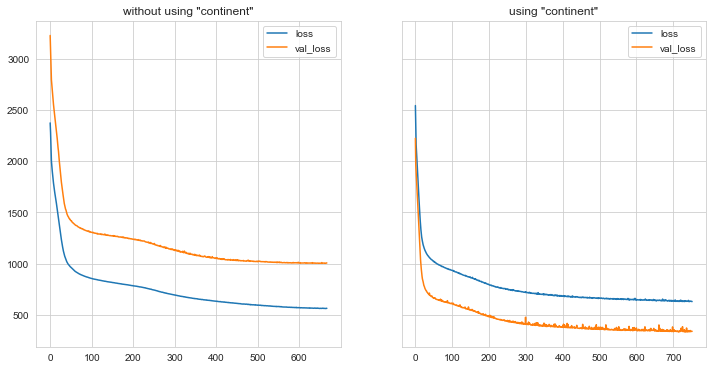

In [234]:
model2_loss = pd.DataFrame(model2.history.history)
fig, axes = plt.subplots(1,2,figsize=(12,6), sharey=True)
axes[0].plot(model_loss['loss'],label='loss')
axes[0].plot(model_loss['val_loss'],label='val_loss')
axes[0].legend()
axes[0].set_title('without using "continent"')
axes[1].plot(model2_loss['loss'],label='loss')
axes[1].plot(model2_loss['val_loss'],label='val_loss')
axes[1].legend()
axes[1].set_title('using "continent"')

In [254]:
y2_train_pred = model2.predict(X2_train)
list2 = np.stack((y2_train[::,0], y2_train_pred[::,0]))
list2[:10].transpose()

array([[ 2.657     ,  0.        ],
       [12.969     ,  0.        ],
       [24.714     , 48.29903412],
       ...,
       [ 3.798     , 47.58568573],
       [ 0.        ,  0.        ],
       [ 0.683     ,  0.        ]])

#### Comment:

Something very interesting here: after adding 'continent' to the feature list, the validation error is largely reduced, and even smaller than trainning error, quickly after a few iterations. This may indicate the country location has quite some impact on the result. Will grab tomorrow's data to check.
